# Tarea 1 - Física computacional
## Rizo Franco Samantha
### Hecho en Julia

## 1. Realice y explique los desarrollos necesarios para obtener los siguientes algoritmos:
#### a) Encuentre una expresión para la segunda derivada numérica de orden 4 con malla uniforme. (Se desprecian términos $h^5$ en la serie de Taylor)


Para obtener la expresión para la segunda derivada de una función en el punto $x_0$ con una precisión en la que se desprecian términos en $h^5$, utilizamos el Teorema de Taylor para expresar la función f(x) en 4 diferentes puntos alrededor de $x_0$.

$$
f(x_0+h)=f(x_0) + f'(x_0)h + \frac{f''(x_0)}{2!}h^2 + \frac{f'''(x_0)}{3!}h^3 + \frac{f^{IV}(x_0)}{4!}h^4 + \Theta(h^5) \quad ...(1)
$$
$$
f(x_0-h)=f(x_0) - f'(x_0)h + \frac{f''(x_0)}{2!}h^2 - \frac{f'''(x_0)}{3!}h^3 + \frac{f^{IV}(x_0)}{4!}h^4 + \Theta(h^5)\quad ...(2)
$$
$$
f(x_0+2h)=f(x_0) + 2f'(x_0)h + 2f''(x_0)h^2 + \frac{4}{3}f'''(x_0)h^3 + \frac{2}{3}f^{IV}(x_0)h^4 + \Theta(h^5) \quad ...(3)
$$
$$
f(x_0-2h)=f(x_0) - 2f'(x_0)h + 2f''(x_0)h^2 - \frac{4}{3}f'''(x_0)h^3 + \frac{2}{3}f^{IV}(x_0)h^4 + \Theta(h^5)\quad ...(4)
$$
A continuación como buscamos la 2 derivada, sumamos las ecuaciones (1)+(2) y (3)+(4) y obtenemos las siguientes ecuaciones:

$$ \Rightarrow 
f(x_0+h)+f(x_0-h)=2f(x_0) +f''(x_0)h^2+ \frac{1}{12}f^{IV}(x_0)h^4+\Theta(h^5) \quad ...(5)
$$
$$
\Rightarrow f(x_0+2h)+f(x_0-2h)=2f(x_0)+4f''(x_0)h^2 + \frac{4}{3}f^{IV}(x_0)h^4+\Theta(h^5) \quad ...(6)
$$

Procedemos a mutiplicar la ecuación (5) por $16$ y queda:
$$
\Rightarrow  16f(x_0+h)+16f(x_0-h)=32f(x_0) + 16f''(x_0)h^2 + \frac{4}{3}f^{IV}(x_0)h^4\quad ...(7)
$$
Resto las ecuacione (6) a la (7): 
$$
16f(x_0+h)+16f(x_0-h)-f(x_0+2h)-f(x_0-2h)=30f(x_0)+12f''(x_0)h^2
$$
$$
\Rightarrow 16f_{i+1}+16f_{i-1}-f_{i+2}-f_{i-2}=30f_i+12f_i''h^2$$

Despejamos la segunda derivada y resulta que la expresión para la segunda derivada de orden cuatro es:

$$
f''(x_0) = \frac{16f(x_0+h)+16f(x_0-h)-f(x_0+2h)-f(x_0-2h) - 30f(x_0)}{12h^2}
$$
$$
\Rightarrow f''(x_i) = \frac{1}{12h^2}\left(16f_{i+1}+16f_{i-1}-f_{i+2}-f_{i-2}-30f_i\right)
$$
Ahora, para calcular la derivada en los extremos necesitamos las expresiones para $x_0+h$, $x_0+2h$, $x_0+3h$ y $x_0+4h$ con el siguiente sistema de ecuaciones:
$$
\begin{bmatrix}
1 & \frac{1}{2!} & \frac{1}{3!} & \frac{1}{4!} \\
2 & 2 & \frac{4}{3} & \frac{2}{3} \\
3 & \frac{9}{2} & \frac{9}{2} & \frac{27}{8} \\
4 & 8 & \frac{32}{3} & \frac{32}{3}
\end{bmatrix}
\begin{bmatrix}
hf_i' \\
h^2f_i'' \\
h^3f_i''' \\
h^4f_i''''
\end{bmatrix}
=
\begin{bmatrix}
f_{i+1}-f_i \\
f_{i+2}-f_i \\
f_{i+3}-f_i \\
f_{i+4}-f_i 
\end{bmatrix}
$$
La solución para $f_i''$ es la del segundo reglón y es:
$$
f_i'' = \frac{-\frac{26}{3}f_{i+1}+\frac{19}{2}f_{i+2}-\frac{14}{3}f_{i+3}+\frac{11}{12}f_{i+4}+\frac{35}{12}f_i}{h^2}
$$
Para el primer punto sustituimos $i=1$ y para el lado derecho hay que cambiar $i+1\longrightarrow i-1$, $i+2\longrightarrow i-2$, $i+3\longrightarrow i-3$, $i+4\longrightarrow i-4$, $h\longrightarrow -h$.

In [1]:
using Plots #Biblioteca que utilizaremos para graficar.

In [2]:
function deriv2_h5(f,x) 
    f_2prima = zeros(length(f)) #vector de ceros del mismo tamaño que f, lo vamos a llenar
    h = x[2] - x[1] #Los puntos siempre van a estar separados la distancia que haya entre el 1er y 2ndo elemento de x porque todos son equidistantes. (Malla uniforme)
    doceh2 = 12*(h^2)
    for i in 3:(length(f)-2) #el for corre sobre este intervalo ya que no estamos considerando los puntos extremos: 2 al inicio y 2 al final
        f_2prima[i] = ( 16*(f[i+1]+ f[i-1]) - f[i+2] - f[i-2] - 30f[i] )/(doceh2)
    end
    #Calculo de los puntos extremos
    #definimos los coeficientes
    c0,c1,c2,c3,c4 = 35/12,-26/3,19/2,-14/3,11/12
    #calculo del primer punto
    f_2prima[1] = ( c0*f[1] + c1*f[2] + c2*f[3] + c3*f[4] + c4*f[5] )/h^2
    # calculo del segundo punto
    f_2prima[2] = ( c0*f[2] + c1*f[3] + c2*f[4] + c3*f[5] + c4*f[6] )/h^2
    # calculo del ultimo punto o el punto N
    f_2prima[end] = ( c0*f[end] + c1*f[end-1] + c2*f[end-2] + c3*f[end-3] + c4*f[end-4] )/h^2
    # calculo del penultimo punto o el N-1
    f_2prima[end-1] = ( c0*f[end-1] + c1*f[end-2] + c2*f[end-3] + c3*f[end-4] + c4*f[end-5] )/h^2
    return f_2prima
end

deriv2_h5 (generic function with 1 method)

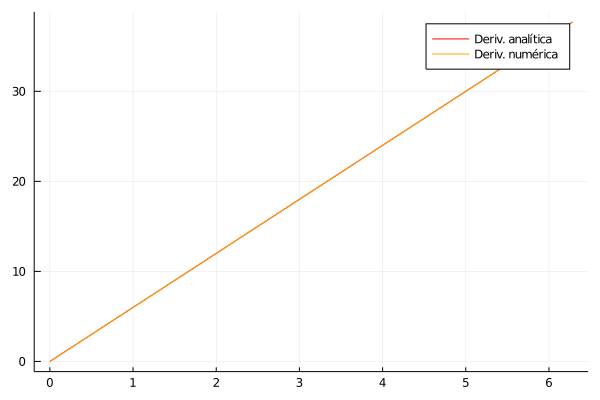

In [3]:
x1 =collect(range(0,2π,length=500))#Damos una malla uniforme
#Escogemos la función de prueba
y1 =x1.^3
Dy =6*x1
num_deriv2_h5 = deriv2_h5(y1,x1)
#Graficamos para comprobar que la derivada numerica y la analítica son iguales
plot(x1,Dy,linecolor=:red,label="Deriv. analítica")
plot!(x1,num_deriv2_h5,linecolor=:orange,label="Deriv. numérica")

#### b)  Encuentre una expresión para la derivada numérica de $2^\circ$ orden para una malla no uniforme. (Se desprecian términos $h^3$ en la serie de Taylor)
Queremos obtener la derivada de una función en el punto $x_0$ con una precisión en la que se desprecian términos en $h^3$. Buscamos la derivada para una malla no uniforme por lo que tenemos dos valores de h (realizaremos operaciones con un punto a la izquierda $h_1$ y otro a la derecha $h_2$. Comenzamos con las siguientes expansiones en serie de Taylor alrededor de un punto $x_0$:
$$
f(x_0-h_1)=f(x_0)-f'(x_0)h_1 + \frac{1}{2}f''(x_0)h_1^2 + \Theta(h^3)\quad...(8)
$$

$$
f(x_0+h_2)=f(x_0)+f'(x_0)h_2 + \frac{1}{2}f''(x_0)h_2^2 + \Theta(h^3)\quad...(9)
$$
Multiplicamos las ecuaciones $h_1^2(9)$ y $h_2^2(8)$ y obtenemos:
$$
\Rightarrow h_2^2f(x_0-h_1)=h_2^2f(x_0)-f'(x_0)h_1h_2^2 + \frac{1}{2}f''(x_0)h_1^2h_2^2 + \Theta(h^3)\quad...(10)
$$
$$
\Rightarrow h_1^2f(x_0+h_2)=h_1^2f(x_0)+f'(x_0)h_1^2h_2 + \frac{1}{2}f''(x_0)h_2^2h_1^2 + \Theta(h^3)\quad...(11)
$$
Restamos la ecuación (10) de la (11):
$$
\Rightarrow h_1^2f(x_0+h_2)h_2^2f(x_0-h_1)=f(x_0)(h_1^2-h_2^2)+ \frac{1}{2}f'(x_0)[h_1^2h_2+h_1h_2^2] + \Theta(h_1^3,h_2^3)\quad...(12)
$$
Despejamos $f'(x_0)$ de (12) y tenemos que la derivada de orden 2 en una malla no uniforme (sin considerar sus puntos en la frontera) es:
$$
\Rightarrow f'(x_0)=\frac{h_1^2f(x_0+h_2)h_2^2f(x_0-h_1)-f(x_0)(h_1^2-h_2^2)}{h_1^2h_2+h_1h_2^2}
$$
En la expresión anterior no se vale en los puntos frontera. Entonces obtengamos la derivada en los puntos de la frontera derecha, tomando $h_1=x_1-x_0$, $h_2=x_2-x_0$ y realizando la expansión en serie de Taylor: 
$$\Rightarrow f(x_0+h_2)=f(x_0)+f'(x_0)h_2+\frac{1}{2}f''(x_0)h_2^2+\Theta(h^3)$$
Lo podemos ver de la siguiente forma:
$$
\begin{bmatrix}
h_1 & \frac{1}{2}h_1^2   \\
h_2 & \frac{1}{2}h_2^2 \\
\end{bmatrix}
\begin{bmatrix}
f_i' \\
f_i'' 
\end{bmatrix}
=
\begin{bmatrix}
f_{i+1}-f_i \\
f_{i+2}-f_i  
\end{bmatrix}
$$
De donde obtenemos:
$$\Rightarrow f'(x_0)=\frac{h_2^2(f_{i+1}-f_i)-h_1^2(f_{i+2}-f_i)}{h_1h_2^2-h_1^2h_2} $$
$$\Rightarrow f'(x_0)=\frac{h_2^2f_{i+1}-h_2^2f_i-h_1^2f_{i+2}+h_1^2f_i}{h_1h_2^2-h_1^2h_2} $$
La ecuación para la frontera izquierda es:
$$\Rightarrow f'(x_0)=\frac{h_2^2f_{i+1}-h_1^2f_{i+2}+f_i(h_1^2-h_2^2)}{h_1h_2^2-h_1^2h_2} $$
La ecuación para la frontera derecha reuslta de realizar los siguientes cambios $i+1\longrightarrow i-1$, $i+2\longrightarrow i-2$, $i=N$

In [79]:
function deriv1_h3(f,x) 
    f_prima = zeros(length(f)) #vector de ceros del mismo tamaño que f, lo vamos a llenar
    for i in 2:(length(f)-1) #el for corre sobre este intervalo ya que no estamos considerando los puntos extremos
        h1=x[i]-x[i-1] #h1 es la distancia entre el punto i y el punto a la izquierda
        h2=x[i+1]-x[i] #h2 es la distancia entre el punto i y el punto a la derecha
        f_prima[i]= (((h1^2)*f[i+1]*(h2^2)*f[i-1])-(f[i]*((h1^2)-(h2^2))))/(((h1^2)*h2)+(h1*(h2^2)))
    end
    #Calculo de los extremos
    #calculo del primer punto
    
    hder1=x[2]-x[1] #Para el primer punto, los dos puntos que va a consideran van a ser los dos a la derecha 
    hder2=x[3]-x[1]
    
    f_prima[1]=(((hder2^2)*f[2])-((hder2^2)*f[1])-((hder1^2)*f[3])+((hder1^2)*f[1]))/((hder1*(hder2^2))-((hder1^2)*hder2))
    
    #calculo del ultimo punto
    
    hizq1=x[end]-x[end-1] ##Para el ultimo punto, los dos puntos que va a consideran van a ser los dos a la izquierda
    hizq2=x[end]-x[end-2]
    
    f_prima[end]=((hizq2^2)*f[end-1])-((hizq2^2)*f[end])-((hizq1^2)*f[end-2])+((hizq1^2)*f[end])/((hizq1*(hizq2^2))-((hizq1^2)*hizq2))
    
    return f_prima
end

deriv1_h3 (generic function with 1 method)

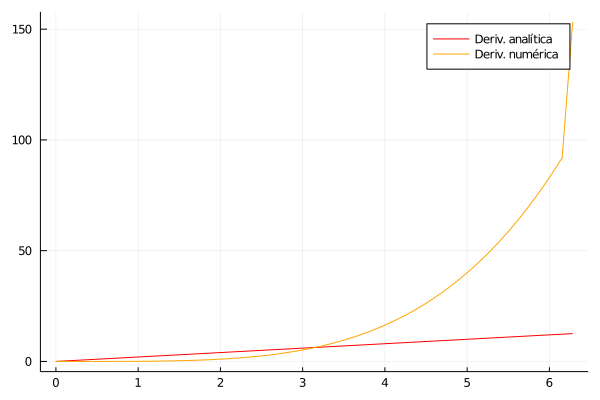

In [80]:
x1 =collect(range(0,2π,length=50))#Damos una malla uniforme
#Escogemos la función de prueba
y1 =x1.^2
Dy =2*x1
num_deriv1_h3 = deriv1_h3(y1,x1)
#Graficamos para comprobar que la derivada numerica y la analítica son iguales
plot(x1,Dy,linecolor=:red,label="Deriv. analítica")
plot!(x1,num_deriv1_h3,linecolor=:orange,label="Deriv. numérica")

#### c) Encuentre una expresión para la segunda derivada numérica de $2^\circ$ orden con malla no uniforme. (Se desprecian t´erminos $h^3$ en la serie de Taylor)


Queremos obtener la derivada de una función en el punto $x_0$ con una precisión en la que se desprecian términos en $h^3$. Buscamos la derivada para una malla no uniforme por lo que tenemos dos valores de h (realizaremos operaciones con un punto a la izquierda $h_1$ y otro a la derecha $h_2$. Comenzamos con las siguientes expansiones en serie de Taylor alrededor de un punto $x_0$:
$$
f(x_0-h_1)=f(x_0)-f'(x_0)h_1 + \frac{1}{2}f''(x_0)h_1^2 + \Theta(h^3)\quad...(8)
$$

$$
f(x_0+h_2)=f(x_0)+f'(x_0)h_2 + \frac{1}{2}f''(x_0)h_2^2 + \Theta(h^3)\quad...(9)
$$
Multiplicamos las ecuaciones $h_1(9)$ y $h_2(8)$ y obtenemos:
$$
\Rightarrow h_2f(x_0-h_1)=h_2f(x_0)-f'(x_0)h_1h_2 + \frac{1}{2}f''(x_0)h_1^2h_2 + \Theta(h^3)\quad...(13)
$$
$$
\Rightarrow h_1f(x_0+h_2)=h_1f(x_0)+f'(x_0)h_1h_2 + \frac{1}{2}f''(x_0)h_1h_2^2 + \Theta(h^3)\quad...(14)
$$
Sumamos las ecuaciones (13) y (14):
$$
\Rightarrow h_2f(x_0-h_1)+h_1f(x_0+h_2)=f(x_0)(h_1+h_2)+ \frac{1}{2}f''(x_0)[h_1h_2^2+h_1^2h_2]+ \Theta(h_1^3,h_2^3)\quad...(15)
$$
Despejamos $f''(x_0)$ de (12) y tenemos que la segunda derivada de orden 2 en una malla no uniforme (sin considerar sus puntos en la frontera) es:
$$
\Rightarrow f''(x_0)=2\frac{h_2f(x_0-h_1)+h_1f(x_0+h_2)-f(x_0)(h_1+h_2)}{[h_1h_2^2+h_1^2h_2]}
$$
En la expresión anterior no se vale en los puntos frontera. Entonces obtengamos la derivada en los puntos frontera, tenemos que hacerlos por separado porque la malla no es uniforme. Para la forntera derecha, hacemos $h_1=x_1-x_0$, $h_2=x_2-x_0$ con la expansión de serie de Taylor.
$$
\Rightarrow f(x_0+h_1)=f(x_0)+f'(x_0)h_1 + \frac{1}{2}f''(x_0)h_1^2 + \Theta(h^3)
$$

$$
\Rightarrow f(x_0+h_2)=f(x_0)+f'(x_0)h_2 + \frac{1}{2}f''(x_0)h_2^2 + \Theta(h^3)
$$
Lo podemos ver de la siguiente forma:
$$
\begin{bmatrix}
h_1 & \frac{1}{2}h_1^2   \\
h_2 & \frac{1}{2}h_2^2 \\
\end{bmatrix}
\begin{bmatrix}
f_i' \\
f_i'' 
\end{bmatrix}
=
\begin{bmatrix}
f_{i+1}-f_i \\
f_{i+2}-f_i  
\end{bmatrix}
$$
de donde obtenemos:
$$\Rightarrow f''(x_0)=2\frac{h_1(f_{i+2}-f_i)-h_2(f_{i+1}-f_i)}{h_1h_2^2-h_1^2h_2}$$
$$\Rightarrow f''(x_0)=2\frac{h_1f_{i+2}-h_1f_i-h_2f_{i+1}+h_2f_i}{h_1h_2^2-h_1^2h_2}$$
$$\Rightarrow f''(x_0)=2\frac{h_1f_{i+2}-h_2f_{i+1}+f_i(h_2-h_1)}{h_1h_2^2-h_1^2h_2}$$
La ecuación para la frontera derecha reuslta de realizar los siguientes cambios $i+1\longrightarrow i-1$, $i+2\longrightarrow i-2$, $i=N$

In [13]:
function deriv2_h3(f,x)
    f_2prima = zeros(length(f))
    for i in 2:(length(f)-1)
        h1=x[i]-x[i-1] #h1 es la distancia entre el punto i y el punto a la izquierda
        h2=x[i+1]-x[i] #h2 es la distancia entre el punto i y el punto a la derecha
        f_2prima[i] = 2*( ((h2*f[i-1])+(h1*f[i+1])-(f[i]*(h1+h2)))/((h1*(h2^2))+((h1^2)*h2)) )
    end
    #Calculo de los extremos
    #calculo del primer punto
    
    hder1=x[2]-x[1] #Para el primer punto, los dos puntos que va a consideran van a ser los dos a la derecha 
    hder2=x[3]-x[1]
    
    f_2prima[1] = 2*( ((hder1*f[3])-(hder2*f[2])+(f[1]*(hder2-hder1)))/((hder1*(hder2^2))-((hder1^2)*hder2))  )
    
    #calculo del ultimo punto
    
    hizq1=x[end]-x[end-1] ##Para el ultimo punto, los dos puntos que va a consideran van a ser los dos a la izquierda
    hizq2=x[end]-x[end-2]
    
    f_2prima[end] = 2*( ((hizq1*f[end-2])-(hizq2*f[end-1])+(f[end]*(hizq2-hizq1)))/((hizq1*(hizq2^2))-((hizq1^2)*hizq2))  )
    
    return f_2prima   
end

deriv2_h3 (generic function with 1 method)

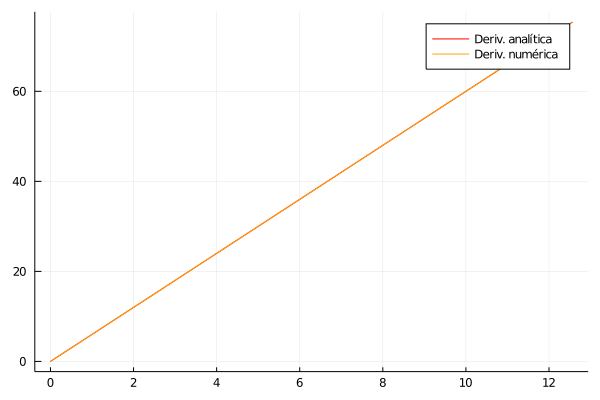

In [14]:
x1 =collect(range(0,4π,length=500))#Damos una malla uniforme
#Escogemos la función de prueba
y1 =x1.^3
Dy =6*x1
num_deriv2_h3 = deriv2_h3(y1,x1)
#Graficamos para comprobar que la derivada numerica y la analítica son iguales
plot(x1,Dy,linecolor=:red,label="Deriv. analítica")
plot!(x1,num_deriv2_h3,linecolor=:orange,label="Deriv. numérica")

## 2. Utilizando las funciones anteriores calcule el tiempo promedio para una malla con 500 puntos en cada uno de los algoritmos anteriores. De una explicación de las ventajas y desventajas de cada una las funciones antes mencionadas.

Importamos la paquetería de BenchmarkTools para calcular el tiempo que le tomaría a la función realizar los cálculos con 50 puntos en el dominio.

In [15]:
using BenchmarkTools

Las funciones que programamos en (1) calculan la primera o segunda derivada de una función de manera numérica pero debemos escoger una función aleatoria para medir cuanto tiempo tarda.
Nosotros elegimos la función:
$$y=e^x$$

#### a) Expresión para la segunda derivada numérica de orden 4 con malla uniforme.

In [16]:
x = collect(1:1:500) #Definimos una malla uniforme de 500 puntos  
y = exp.(x) #Funcion a la cual le vamos a calcular la derivada para cada punto
println("Número de puntos: ",length(x))
@benchmark deriv2_h5(y,x)


Número de puntos: 500


BenchmarkTools.Trial: 
  memory estimate:  4.06 KiB
  allocs estimate:  1
  --------------
  minimum time:     3.396 μs (0.00% GC)
  median time:      4.981 μs (0.00% GC)
  mean time:        7.551 μs (12.19% GC)
  maximum time:     1.547 ms (99.53% GC)
  --------------
  samples:          10000
  evals/sample:     8

Tarda un tiempo promedio de $6.707 \mu s$

#### b) Expresión para la derivada numérica de $2^\circ$ orden para una malla no uniforme.

In [17]:
#Construimos una malla no uniforme de 500 puntos
x_a = collect(1:1:500) #De 1 a 500 en pasos de 2
x_b = collect(501:1:750) #De 501 a 750 en pasos de 1
x = vcat(x_a,x_b) #malla compuesta  
y = exp.(x) #Funcion a la cual le vamos a calcular la derivada para cada punto
println("Número de puntos: ",length(x))
@benchmark deriv1_h3(y,x)

Número de puntos: 750


BenchmarkTools.Trial: 
  memory estimate:  6.00 KiB
  allocs estimate:  1
  --------------
  minimum time:     5.333 μs (0.00% GC)
  median time:      11.873 μs (0.00% GC)
  mean time:        15.386 μs (10.62% GC)
  maximum time:     3.344 ms (0.00% GC)
  --------------
  samples:          10000
  evals/sample:     6

Tarda un tiempo promedio de $10.314 \mu s$.

#### c) Expresión para la segunda derivada numérica de $2^\circ$ orden con malla no uniforme.

In [18]:
#Construimos una malla no uniforme de 500 puntos
x_a = collect(1:1:500) #De 1 a 500 en pasos de 2
x_b = collect(501:1:750) #De 501 a 750 en pasos de 1
x = vcat(x_a,x_b) #malla compuesta  
y = exp.(x) #Funcion a la cual le vamos a calcular la derivada para cada punto
println("Número de puntos: ",length(x))
@benchmark deriv2_h3(y,x)

Número de puntos: 750


BenchmarkTools.Trial: 
  memory estimate:  6.00 KiB
  allocs estimate:  1
  --------------
  minimum time:     4.930 μs (0.00% GC)
  median time:      9.156 μs (0.00% GC)
  mean time:        13.813 μs (5.93% GC)
  maximum time:     4.394 ms (0.00% GC)
  --------------
  samples:          10000
  evals/sample:     6

Tarda un tiempo pormedio de $7.152 \mu s$

#### De una explicación de las ventajas y desventajas de cada una las funciones antes mencionadas

Para calcular la segunda derivada usamos 2 funciones la a) de orden 4 con malla uniforme y la c) de orden 2 con malla no uniforme. Podemos ver que la de a) es más precisa y rápida que la c), pero la c) es para mallas no uniformes (un caso más general que el de a) así que es más util que la a); podemos concluir que la a) tiene 2 ventajas sobre la c) y la c) tiene una ventaja sobre la a).

Para calcular la primer derivada usamos la función b) de orden 2 con malla no uniforme. Podemos ver que la c) tiene un tiempo promedio mayor que a) y menor que c) y toma mallas no uniformes al igual que el de c) lo cual es ventajoso probablemente es más rápida que c) porque sólo pide la primer derivada.

## 3. Calcule la derivada analítica de las funciones $f(x) = e^{−x^2}\sin(10x)$ con $x\in [−5, 5]$, y $g(x) =-\frac{2}{x^6} +\frac{1}{x^12}$ con $x \in [0.5, 5]$. Realice las gráficas de las funciones y sus primeras dos derivadas. Con las funciones del problema 1, encuentre una malla adecuada para cada caso en el que el error de cálculo sea menor que $10^{−5}$ para cualquier punto. ¿Las mallas tienen el mismo espacio entre puntos de la malla?, explique porque si o porque no.

#### Calcule la derivada analítica de las funciones $f(x) = e^{−x^2}\sin(10x)$ con $x\in [−5, 5]$. Realice las gráficas de las funciones y sus primeras dos derivadas.

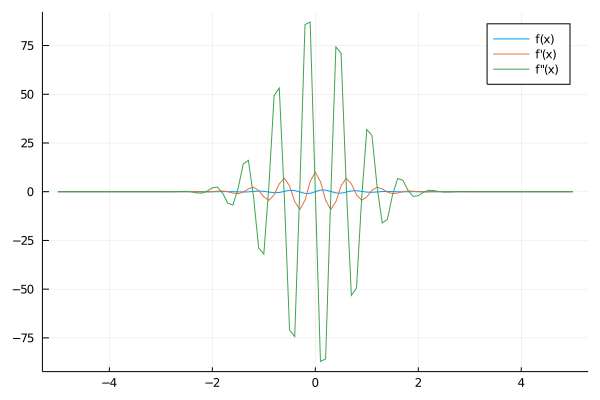

In [19]:
x1= collect(-5:0.1:5) #intervalo de la x: de -5 a 5
f=exp.(-(x1.^2)).*sin.(10*x1) #definicion de f
df= (2*exp.(-(x1.^2))).*((5*cos.(10*x1)) - (x1.*sin.(10*x1))) #derivada analítica de f
d2f= (exp.(-(x1.^2))).*(((2*((2*(x1.^2)).-51)).*(sin.(10*x1))).-((40*x1).*cos.(10*x1))) #segunda derivada analítica de f

plot(x1,f,label="f(x)") #Grafica de f
plot!(x1,df,label="f'(x)") #Grafica de f'
plot!(x1,d2f,label="f''(x)") #Grafica de f''

#### Calcule la derivada analítica de las funciones $g(x) =-\frac{2}{x^6} +\frac{1}{x^12}$ con $x \in [0.5, 5]$. Realice las gráficas de las funciones y sus primeras dos derivadas.

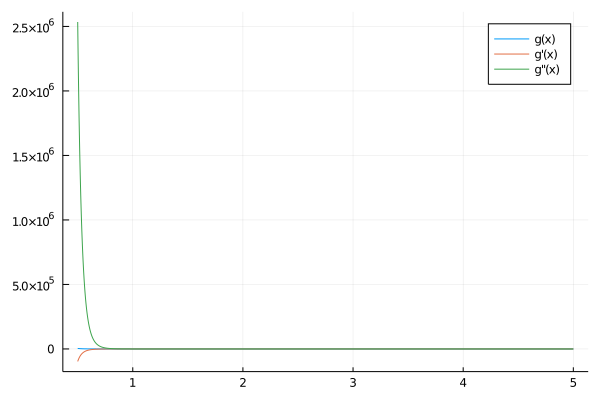

In [20]:
x2=collect(0.5:0.001:5) #intervalo de las x: de 0.5 a 5
g = -2*((x2.^6).^(-1)) + 1*((x2.^(12)).^(-1)) #definicion de g
dg = (12*(x2.^(6).-1)).*(x2.^(-13)) #derivada analítica de g 
d2g =(-84*(x2.^6).+156).*(x2.^(-14)) #segunda derivada analítica de g

plot(x2,g,label="g(x)") #Grafica de g
plot!(x2,dg,label="g'(x)") #Grafica de g'
plot!(x2,d2g,label="g''(x)") #Grafica de g''

#### Con las funciones del problema 1, encuentre una malla adecuada para cada caso en el que el error de cálculo sea menor que $10^{−5}$ para cualquier punto. ¿Las mallas tienen el mismo espacio entre puntos de la malla?, explique porque si o porque no.

Variamos el tamaño del paso dentro del collect hasta encontrar el adecuado para que el error sea menor a $10^{-5}$. (Solo pondremos el código del tamaño del paso adecuado)

**a) Segunda derivada de orden 4 para malla uniforme.**

$f(x)=e^{-x^2} \sin(10x)$:

Error con h5 = 8.988354338157478e-6


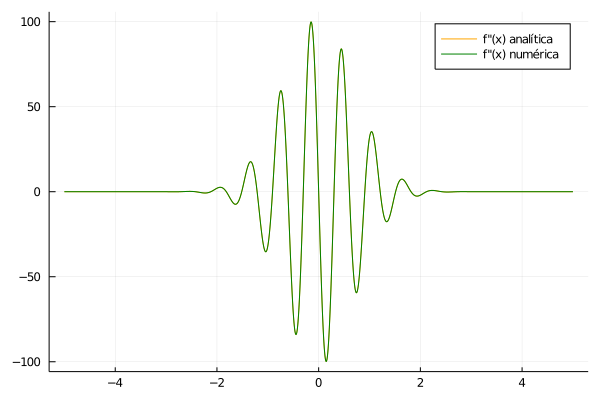

In [21]:
#Funcion f(x)
x1= collect(-5:0.005:5) #intervalo de la x: de -5 a 5
f=exp.(-(x1.^2)).*sin.(10*x1) #definicion de f
d2f= (exp.(-(x1.^2))).*(((2*((2*(x1.^2)).-51)).*(sin.(10*x1))).-((40*x1).*cos.(10*x1))) #segunda derivada analítica de f

num_deriv2_h5 = deriv2_h5(f,x1) #segunda derivada numérica de orden 4 de f(x)

println("Error con h5 = " , maximum(abs.(d2f-num_deriv2_h5)) ) #Imprime el error maximo entre num_deriv2_h5 y d2f

#Graficamos para comprobar que la derivada numerica y la analítica son iguales
plot(x1,d2f,linecolor=:orange,label="f''(x) analítica")
plot!(x1,num_deriv2_h5,linecolor=:green,label="f''(x) numérica")

Como el error es igual a $8.988354338157478 \times 10^{-6} < 10^{-5}$, por lo tanto el tamaño de paso adecuado es: 0.005

$g(x)=-\frac{2}{x^6} + \frac{1}{x^{12}}$:

Error con h5 = 0.05660229409113526


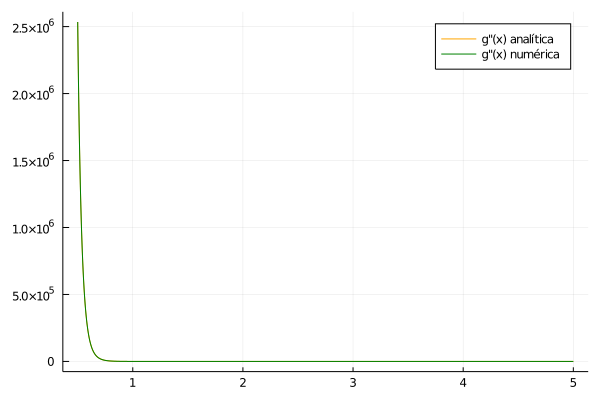

In [46]:
#Funcion g(x)
x2=collect(0.5:0.0001:5) #intervalo de las x: de 0.5 a 5
g = -2*((x2.^6).^(-1)) + 1*((x2.^(12)).^(-1)) #definicion de g
d2g =(-84*(x2.^6).+156).*(x2.^(-14)) #segunda derivada analítica de g

num_deriv2_h5 = deriv2_h5(g,x2) #segunda derivada numérica de orden 4 de g(x)

println("Error con h5 = " , maximum(abs.(d2g-num_deriv2_h5)) ) #Imprime el error maximo entre num_deriv2_h5 y d2g

#Graficamos para comprobar que la derivada numerica y la analítica son iguales
plot(x2,d2g,linecolor=:orange,label="g''(x) analítica")
plot!(x2,num_deriv2_h5,linecolor=:green,label="g''(x) numérica")

Como el error es igual a $ 1.4875006589589696e6\times 10^{-6} < 10^{-5}$, por lo tanto el tamaño de paso adecuado es: 0.1

**b) Derivada de orden 2 para malla no uniforme**

$f(x)=e^{-x^2} \sin(10x)$:

In [52]:
#Funcion f(x)
x_a= collect(-5:0.0001:5)
x_b=
x1= vcat(x_a,x_b) #malla compuesta  
f=exp.(-(x1.^2)).*sin.(10*x1) #definicion de f
df= (2*exp.(-(x1.^2))).*((5*cos.(10*x1)) - (x1.*sin.(10*x1))) #derivada analítica de f

num_deriv1_h3 = deriv1_h3(f,x1) #segunda derivada numérica de orden 2 de f(x)

println("Error con h3 = " , maximum(abs.(df-num_deriv1_h3)) ) #Imprime el error maximo entre num_deriv1_h3 y d2f
#Graficamos para comprobar que la derivada numerica y la analítica son iguales
plot(x1,df,linecolor=:orange,label="f'(x) analítica")
plot!(x1,num_deriv1_h3,linecolor=:green,label="f'(x) numérica")

Error con h3 = 10.000000049998233


Como el error es igual a $ \times 10^{-6} < 10^{-5}$, por lo tanto el tamaño de paso adecuado es:

$g(x)=-\frac{2}{x^6} + \frac{1}{x^{12}}$:

Error con h3 = 101767.26413465977


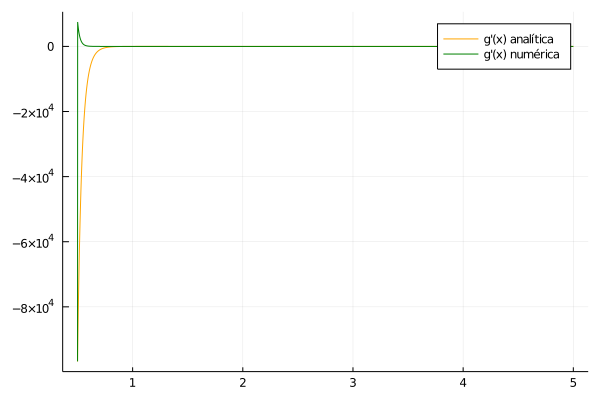

In [56]:
#Funcion g(x)
x2=collect(0.5:0.001:5) #intervalo de las x: de 0.5 a 5
g = -2*((x2.^6).^(-1)) + 1*((x2.^(12)).^(-1)) #definicion de g
dg = (12*(x2.^(6).-1)).*(x2.^(-13)) #derivada analítica de g 
num_deriv1_h3 = deriv1_h3(g,x2) #segunda derivada numérica de orden 4 de f(x)

println("Error con h3 = " , maximum(abs.(dg-num_deriv1_h3)) ) #Imprime el error maximo entre num_deriv1_h3 y d2f

#Graficamos para comprobar que la derivada numerica y la analítica son iguales
plot(x2,dg,linecolor=:orange,label="g'(x) analítica")
plot!(x2,num_deriv1_h3,linecolor=:green,label="g'(x) numérica")

Como el error es igual a $ \times 10^{-6} < 10^{-5}$, por lo tanto el tamaño de paso adecuado es: 0.005

**c) Segunda derivada de orden 2 para malla no uniforme**

$f(x)=e^{-x^2} \sin(10x)$:

In [48]:
#Funcion f(x)
x1= collect(-5:0.00005:5) #intervalo de la x: de -5 a 5
f=exp.(-(x1.^2)).*sin.(10*x1) #definicion de f
d2f= (exp.(-(x1.^2))).*(((2*((2*(x1.^2)).-51)).*(sin.(10*x1))).-((40*x1).*cos.(10*x1))) #segunda derivada analítica de f

num_deriv2_h3 = deriv2_h3(f,x1) #segunda derivada numérica de orden 4 de f(x)

println("Error con h3 = " , maximum(abs.(d2f-num_deriv2_h3)) ) #Imprime el error maximo entre num_deriv2_h3 y d2f

#Graficamos para comprobar que la derivada numerica y la analítica son iguales
plot(x1,d2f,linecolor=:orange,label="f''(x) analítica")
plot!(x1,num_deriv2_h3,linecolor=:green,label="f''(x) numérica")

Error con h3 = 2.4968137068981378e-6


Como el error es igual a $ 2.4968137068981378\times 10^{-6} < 10^{-5}$, por lo tanto el tamaño de paso adecuado es: 0.00005

$g(x)=-\frac{2}{x^6} + \frac{1}{x^{12}}$:

In [57]:
#Funcion g(x)
x2=collect(0.5:0.0000000001:5) #intervalo de las x: de 0.5 a 5
g = -2*((x2.^6).^(-1)) + 1*((x2.^(12)).^(-1)) #definicion de g
d2g =(-84*(x2.^6).+156).*(x2.^(-14)) #segunda derivada analítica de g

num_deriv2_h3 = deriv2_h3(g,x2) #segunda derivada numérica de orden 4 de g(x)

println("Error con h3 = " , maximum(abs.(d2g-num_deriv2_h3)) ) #Imprime el error maximo entre num_deriv2_h3 y d2g

#Graficamos para comprobar que la derivada numerica y la analítica son iguales
plot(x2,d2g,linecolor=:orange,label="g''(x) analítica")
plot!(x2,num_deriv2_h3,linecolor=:green,label="g''(x) numérica")

LoadError: OutOfMemoryError()

Como el error es igual a $ \times 10^{-6} < 10^{-5}$, por lo tanto el tamaño de paso adecuado es:

## 4 - Suponga que tiene la función $sinc(x) = \frac{sin(3x)}{x}$ en el intervalo $[−2\pi, 2\pi]$. Calcule la derivada analítica de dicha función y calcule la derivada numérica utilizando una malla uniforme.

Recordamos el algortimo simétrico visto en clase (**Notebook 3 "derivadas"**) para la derivada numérica donde se desprecian términos de onden $h^3$ (de orden 2) para una malla uniforme:

In [59]:
function deriv_h3(f,x)
    f_prima = zeros(length(f))
    h = x[2] - x[1]
    dosh = 2*h
    for i in 2:(length(f)-1)
        f_prima[i] = ( f[i+1]-f[i-1] )/(dosh)
    end
    #Calculo de puntos en la frotera
    # calcular el primer punto
    f_prima[1] = ( -0.5*f[3] + 2*f[2] -1.5*f[1] )/h
    # calcular el ultimo punto
    f_prima[end] = -( -0.5*f[end-2] + 2*f[end-1] -1.5*f[end] )/h    
    return f_prima
end

deriv_h3 (generic function with 1 method)

Y también vimos en clase (**Notebook 3 "derivadas"**), el algoritmo simétrico para la derivada numérica donde se desprecian términos de orden $h^5$ en adelante (de orden 4) para una malla uniforme:

In [60]:
function deriv_h5(f,x)
    f_prima = zeros(length(f))
    h = x[2] - x[1]
    doceh = 12*h
    for i in 3:(length(f)-2)
        f_prima[i] = ( -f[i+2]+ 8*(f[i+1]-f[i-1]) +f[i-2] )/(doceh)
    end
    #Calculo de los puntos frontera
    c0,c1,c2,c3,c4 = -25/12,4,-3,4/3,-0.25
    # calcular el primer punto
    f_prima[1] = ( c0*f[1] + c1*f[2] + c2*f[3] + c3*f[4] + c4*f[5] )/h
    # calcular el segundo punto
    f_prima[2] = ( c0*f[2] + c1*f[3] + c2*f[4] + c3*f[5] + c4*f[6] )/h
    # calcular el ultimo punto o el punto N
    f_prima[end] = -( c0*f[end] + c1*f[end-1] + c2*f[end-2] + c3*f[end-3] + c4*f[end-4] )/h
    # calcular el penultimo punto o el N-1
    f_prima[end-1] = -( c0*f[end-1] + c1*f[end-2] + c2*f[end-3] + c3*f[end-4] + c4*f[end-5] )/h
    return f_prima
end

deriv_h5 (generic function with 1 method)

#### a) Dependiendo del lenguaje de programación que utilice, averigüe la manera de obtener los tiempos de ejecución para calcular la derivada utilizando los algoritmos de $2^\circ$ y $4^\circ$ orden.

Tiempos de ejecución para calcular la derivada utillizando el algoritmo de 2ndo orden:

In [61]:
x = collect(-2π:1:2π) #Intervalo de las x: -2π a 2π   (Malla uniforme)
sinc = (sin.(3*x)).*(x.^(-1)) #definicion de la funcion sinc(x) (Funcion a la cual le vamos a calcular la derivada para cada punto)
println("Número de puntos: ",length(x))
@benchmark deriv_h3(sinc,x)

Número de puntos: 13


BenchmarkTools.Trial: 
  memory estimate:  192 bytes
  allocs estimate:  1
  --------------
  minimum time:     133.929 ns (0.00% GC)
  median time:      221.364 ns (0.00% GC)
  mean time:        224.316 ns (3.30% GC)
  maximum time:     3.452 μs (94.13% GC)
  --------------
  samples:          10000
  evals/sample:     870

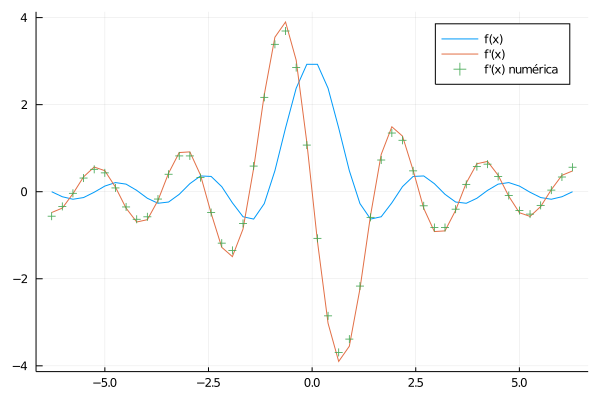

In [48]:
x = collect(range(-2π,2π,length=50))
y = (sin.(3*x)).*(x.^(-1)) #Funcion a la cual le vamos a calcular la derivada para cada punto
y_deriv = ((3*x.*cos.(3*x)).-sin.(3*x))./(x.^2)
y_num_deriv = deriv_h3(y,x)
plot(x,y,label="f(x)")
plot!(x,y_deriv,label="f'(x)")
scatter!(x,y_num_deriv,label="f'(x) numérica",m=:cross)

Tiempos de ejecuación para calcular la derivada utilizando el algoritmo de 4to orden:

In [62]:
x = collect(-2π:1:2π) #Intervalo de las x: -2π a 2π   (Malla uniforme)  
sinc = (sin.(3*x)).*(x.^(-1)) #definicion de la funcion sinc(x) (Funcion a la cual le vamos a calcular la derivada para cada punto)
println("Número de puntos: ",length(x))
@benchmark deriv_h5(sinc,x)

Número de puntos: 13


BenchmarkTools.Trial: 
  memory estimate:  192 bytes
  allocs estimate:  1
  --------------
  minimum time:     161.822 ns (0.00% GC)
  median time:      271.519 ns (0.00% GC)
  mean time:        311.519 ns (2.61% GC)
  maximum time:     33.883 μs (0.00% GC)
  --------------
  samples:          10000
  evals/sample:     776

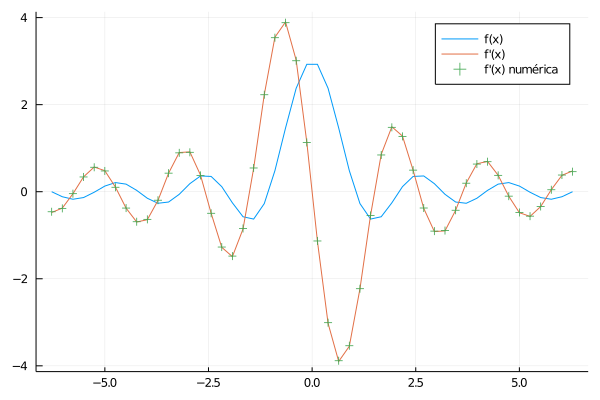

In [63]:
x = collect(range(-2π,2π,length=50))
y = (sin.(3*x)).*(x.^(-1)) #Funcion a la cual le vamos a calcular la derivada para cada punto
y_deriv = ((3*x.*cos.(3*x)).-sin.(3*x))./(x.^2)
y_num_deriv = deriv_h5(y,x)
plot(x,y,label="f(x)")
plot!(x,y_deriv,label="f'(x)")
scatter!(x,y_num_deriv,label="f'(x) numérica",m=:cross)

#### b) Comparando con la solución analítica, encuentre el espacio entre los puntos de la malla para que el error máximo en el cálculo sea menor a $10^{−5}$ para cada algoritmo.


**Algoritmo de orden 2**

In [67]:
x=collect(-2π:0.001:2π) #intervalo de x/ el paso en este caso es 0.001
sinc=(sin.(3*x)).*(x.^(-1)) #definicion de sinc(x)
Dsinc= (((3*x).*(cos.(3*x))).-(sin.(3*x))).*(x.^(-2)); #derivada analítica de sinc(x)

y_h3 = deriv_h3(sinc,x) #derivada numérica de orden 2 de sinc(x)

println("Error con h3 =" , maximum(abs.(Dsinc-y_h3)) ) #Imprime el error maximo entre y_h3 y Dsinc

Error con h3 =3.214378475835389e-6


$\therefore$ El espacio entre los puntos de la malla para que el error máximo sea menor a $10^{-5}$ para el algoritmo de 2ndo orden es: 0.001

**Algoritmo de orden 4**

In [68]:
x=collect(-2π:0.03:2π) #intervalo de x/ el paso en este caso es 0.03
sinc=(sin.(3*x)).*(x.^(-1)) #definicion de sinc(x)
Dsinc= (((3*x).*(cos.(3*x))).-(sin.(3*x))).*(x.^(-2)); #derivada analítica de sinc(x)

y_h5 = deriv_h5(sinc,x) #derivada numérica de orden 4 de sinc(x)

println("Error con h5 =" , maximum(abs.(Dsinc-y_h5)) ) #Imprime el error máximo entre y_h5 y Dsinc

Error con h5 =6.218108020261681e-6


$\therefore$ El espacio entre los puntos de la malla para que el error máximo sea menor a $10^{-5}$ para el algoritmo de 4to orden es: 0.03

#### c) Realice la gráfica del “Número de puntos en el espaciamiento de la malla” vs “Tiempo de ejecución” partiendo de un espaciamiento en los puntos en la malla de $0.25$ hasta el espaciamiento encontrado en el inciso b). Por o menos considere 15 puntos, es decir $15$ mallas deferentes, para realizar este ejercicio.


#### d) ¿Qué puede concluir de este experimento numérico?